<a href="https://colab.research.google.com/github/tiravata/2014-slides/blob/master/21_face_alignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div><img height="45px" src="https://avatars3.githubusercontent.com/u/20337240?s=460&v=4" align="left" hspace="10px" vspace="0px">
</div>
<h1>Face aligmenent</h1>

<hr>

<a href='https://www.facebook.com/programmerthai'><font color='green'>สรุปและเรียบเรียงโดย โปรแกรมเมอร์ไทย thai programmer</font></a>



cite



https://github.com/1adrianb/face-alignment

# วิธีใช้งาน colab

Colab พัฒนาโดย google เป็นหน้าเว็บเอาไว้ใช้เขียนโค้ด python ได้ผ่านทางหน้าเว็บ และเชื่อมต่อกับ google drive ของเราก็ได้ด้วย ซึ่ง colab หน้านี้**ได้รวบรวมเนื้อหา Python ของม.ต้น** เอาไว้ แต่ก่อนอื่นอยากให้ดูวิธีการใช้งาน colab เสียก่อน

<font color='red'>** ต้องมี Gmail และ google drive</font>

<hr/>

<h3>วิธี 1) กด "Open in playgrouhd"</h3>
<div>
<img height="200px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2020/05/python_matayom_4.png" align="center" hspace="10px" vspace="0px">


<hr/>

<h3>วิธี 2) กด Save a copy in Drive ... เพื่อบันทึกไว้ google drive เครื่องเรา</h3>

<img height="300px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2019/11/python_matayom_1.png" align="center" hspace="10px" vspace="0px">

<br/>

<img height="200px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2019/11/python_matayom_2.png" align="center" hspace="10px" vspace="0px">

<hr/>

<h3>จากนั้นถึงจะสามารถรันได้</h3>
<img height="200px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2019/11/python_matayom_3.png" align="center" hspace="10px" vspace="0px">


# Set environment

In [ ]:
!pip install face-alignment > /dev/null

In [ ]:
!git clone https://github.com/1adrianb/face-alignment.git
!mkdir /content/face-alignment/face-alignment_images
%cd  /content/face-alignment/

output_dir = '/content/face-alignment/face-alignment_images/'

Cloning into 'face-alignment'...
remote: Enumerating objects: 563, done.
remote: Total 563 (delta 0), reused 0 (delta 0), pack-reused 563
Receiving objects: 100% (563/563), 3.51 MiB | 16.97 MiB/s, done.
Resolving deltas: 100% (340/340), done.
mkdir: cannot create directory ‘/content/face-alignment/face-alignment_images’: File exists
/content/face-alignment


# Mounting Google Drive locally

In [ ]:
'''
from google.colab import drive
drive.mount('/content/gdrive')
'''

"\nfrom google.colab import drive\ndrive.mount('/content/gdrive')\n"

# ดาวน์โหลดรูปตัวอย่าง

In [ ]:
'''
!git clone https://github.com/1adrianb/face-alignment.git
%cd  /content/face-alignment/

#!mkdir '/content/gdrive/My Drive/tmp/tmp_images'
!mkdir /content/face-alignment/face-alignment_images
'''

"\n!git clone https://github.com/1adrianb/face-alignment.git\n%cd  /content/face-alignment/\n\n#!mkdir '/content/gdrive/My Drive/tmp/tmp_images'\n!mkdir /content/face-alignment/face-alignment_images\n"

--2020-05-10 05:49:04--  https://f.ptcdn.info/774/048/000/ok6xi4qlyh3QuTbSG4N-o.jpg
Resolving f.ptcdn.info (f.ptcdn.info)... 192.99.0.97, 192.99.0.127, 2607:5300:60:3161::, ...
Connecting to f.ptcdn.info (f.ptcdn.info)|192.99.0.97|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 93838 (92K) [image/jpeg]
Saving to: ‘/content/face-alignment/photo.jpg’

/content/face-align 100%[===================>]  91.64K   402KB/s    in 0.2s    

2020-05-10 05:49:05 (402 KB/s) - ‘/content/face-alignment/photo.jpg’ saved [93838/93838]



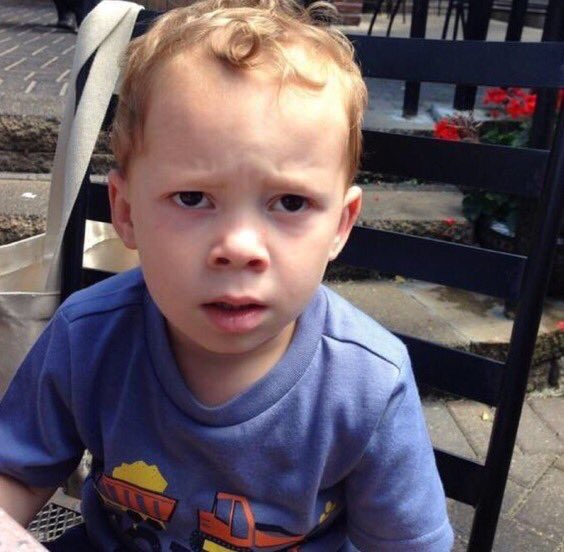

In [ ]:
!wget https://f.ptcdn.info/774/048/000/ok6xi4qlyh3QuTbSG4N-o.jpg -O /content/face-alignment/photo.jpg

file_image = '/content/face-alignment/photo.jpg'

from IPython.display import Image
Image(file_image)

# หรือจะถ่ายรูปตัวเองก็ได้

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

คอมเมนต์ออกเมื่อต้องการใช้งาน

In [ ]:
'''
from IPython.display import Image
try:
  filename = take_photo(file_image)
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))
'''

"\nfrom IPython.display import Image\ntry:\n  filename = take_photo(file_image)\n  print('Saved to {}'.format(filename))\n  \n  # Show the image which was just taken.\n  display(Image(filename))\nexcept Exception as err:\n  # Errors will be thrown if the user does not have a webcam or if they do not\n  # grant the page permission to access it.\n  print(str(err))\n"

# หา landmarks บนหน้าในรูปภาพแบบ 2 มิติ
Detect 2D facial landmarks in pictures

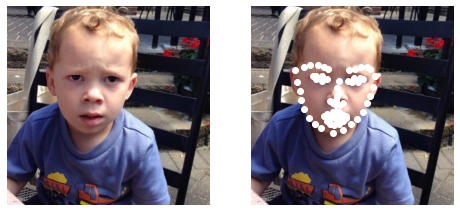

In [ ]:
import face_alignment
import numpy as np
import os
import matplotlib.pyplot as plt
from skimage import io

fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=False)

#input = io.imread('../test/assets/aflw-test.jpg')
#input = io.imread('/content/gdrive/My Drive/tmp/prayut.jpg')
input = io.imread(file_image)
preds = fa.get_landmarks(input)[-1]

#TODO: Make this nice
fig = plt.figure(figsize=plt.figaspect(.5))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(input)
ax.axis('off')

ax = fig.add_subplot(1, 2, 2)
ax.imshow(input)
ax.plot(preds[0:17,0],preds[0:17,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[17:22,0],preds[17:22,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[22:27,0],preds[22:27,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[27:31,0],preds[27:31,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[31:36,0],preds[31:36,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[36:42,0],preds[36:42,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[42:48,0],preds[42:48,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[48:60,0],preds[48:60,1],'wo',markersize=6,color='w',lw=2)
ax.plot(preds[60:68,0],preds[60:68,1],'wo',markersize=6,color='w',lw=2) 

# marker='o' and linestyle='-'
"""
ax.plot(preds[0:17,0],preds[0:17,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[17:22,0],preds[17:22,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[22:27,0],preds[22:27,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[27:31,0],preds[27:31,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[31:36,0],preds[31:36,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[36:42,0],preds[36:42,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[42:48,0],preds[42:48,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[48:60,0],preds[48:60,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[60:68,0],preds[60:68,1],marker='o',markersize=6,linestyle='-',color='w',lw=2) 
"""

ax.axis('off')
plt.savefig(os.path.join(output_dir, "result_2d_exmaple1.png"))
plt.show()

# หา landmarks บนหน้าในรูปภาพแบบ 3 มิติ

Detect 3D facial landmarks in pictures

Downloading: "https://www.adrianbulat.com/downloads/python-fan/3DFAN4-7835d9f11d.pth.tar" to /root/.cache/torch/checkpoints/3DFAN4-7835d9f11d.pth.tar


Downloading: "https://www.adrianbulat.com/downloads/python-fan/depth-2a464da4ea.pth.tar" to /root/.cache/torch/checkpoints/depth-2a464da4ea.pth.tar


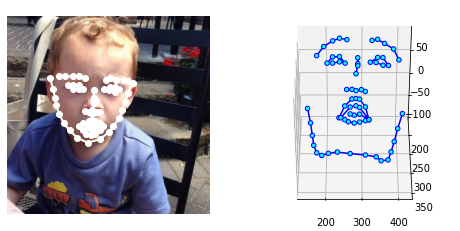

In [ ]:
import face_alignment
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from skimage import io

# Run the 3D face alignment on a test image, without CUDA.
fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._3D, device='cuda:0', flip_input=True)

#input = io.imread('../test/assets/aflw-test.jpg')
#input = io.imread('/content/gdrive/My Drive/tmp/prayut.jpg')
input = io.imread(file_image)
preds = fa.get_landmarks(input)[-1]

#TODO: Make this nice
fig = plt.figure(figsize=plt.figaspect(.5))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(input)
ax.plot(preds[0:17,0],preds[0:17,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[17:22,0],preds[17:22,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[22:27,0],preds[22:27,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[27:31,0],preds[27:31,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[31:36,0],preds[31:36,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[36:42,0],preds[36:42,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[42:48,0],preds[42:48,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[48:60,0],preds[48:60,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
ax.plot(preds[60:68,0],preds[60:68,1],marker='o',markersize=6,linestyle='-',color='w',lw=2) 
ax.axis('off')

ax = fig.add_subplot(1, 2, 2, projection='3d')
surf = ax.scatter(preds[:,0]*1.2,preds[:,1],preds[:,2],c="cyan", alpha=1.0, edgecolor='b')
ax.plot3D(preds[:17,0]*1.2,preds[:17,1], preds[:17,2], color='blue' )
ax.plot3D(preds[17:22,0]*1.2,preds[17:22,1],preds[17:22,2], color='blue')
ax.plot3D(preds[22:27,0]*1.2,preds[22:27,1],preds[22:27,2], color='blue')
ax.plot3D(preds[27:31,0]*1.2,preds[27:31,1],preds[27:31,2], color='blue')
ax.plot3D(preds[31:36,0]*1.2,preds[31:36,1],preds[31:36,2], color='blue')
ax.plot3D(preds[36:42,0]*1.2,preds[36:42,1],preds[36:42,2], color='blue')
ax.plot3D(preds[42:48,0]*1.2,preds[42:48,1],preds[42:48,2], color='blue')
ax.plot3D(preds[48:,0]*1.2,preds[48:,1],preds[48:,2], color='blue' )

ax.view_init(elev=40., azim=90.)
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

# Visualization

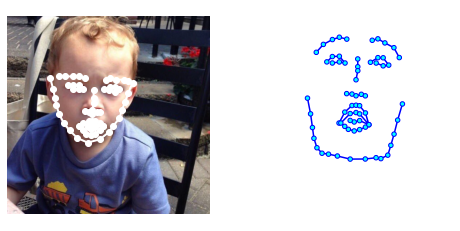

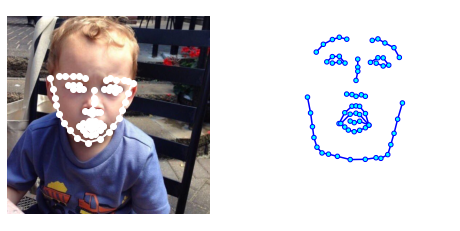

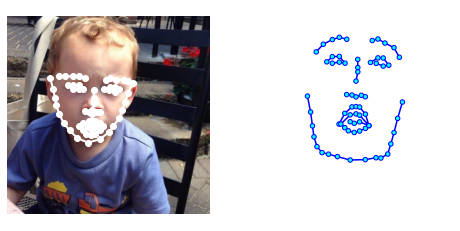

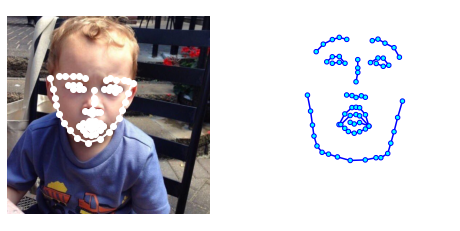

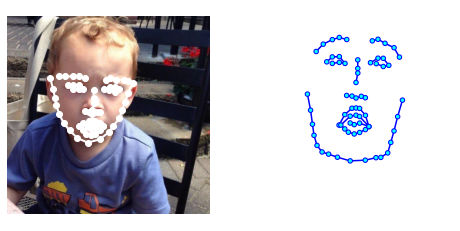

...

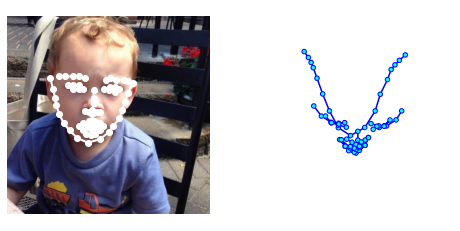

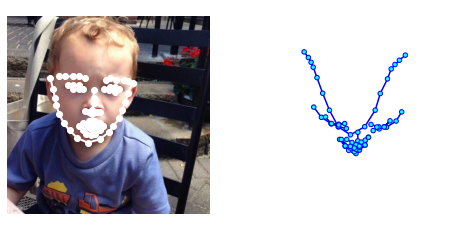

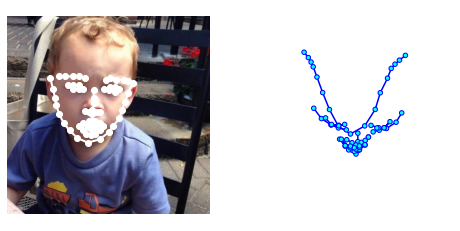

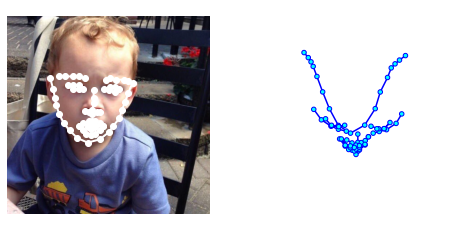

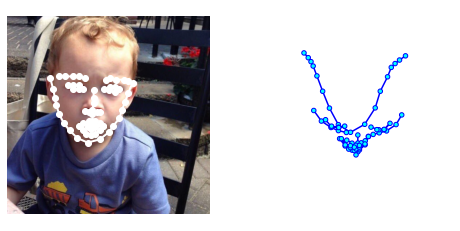

In [ ]:
for i in range(100):
  
  #TODO: Make this nice
  fig = plt.figure(figsize=plt.figaspect(.5))
  ax = fig.add_subplot(1, 2, 1)
  ax.imshow(input)
  
  ax.plot(preds[0:17,0],preds[0:17,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[17:22,0],preds[17:22,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[22:27,0],preds[22:27,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[27:31,0],preds[27:31,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[31:36,0],preds[31:36,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[36:42,0],preds[36:42,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[42:48,0],preds[42:48,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[48:60,0],preds[48:60,1],marker='o',markersize=6,linestyle='-',color='w',lw=2)
  ax.plot(preds[60:68,0],preds[60:68,1],marker='o',markersize=6,linestyle='-',color='w',lw=2) 
  ax.axis('off')
  
  ax = fig.add_subplot(1, 2, 2, projection='3d')
  surf = ax.scatter(preds[:,0]*1.2,preds[:,1],preds[:,2],c="cyan", alpha=1.0, edgecolor='b')
  ax.plot3D(preds[:17,0]*1.2,preds[:17,1], preds[:17,2], color='blue' )
  ax.plot3D(preds[17:22,0]*1.2,preds[17:22,1],preds[17:22,2], color='blue')
  ax.plot3D(preds[22:27,0]*1.2,preds[22:27,1],preds[22:27,2], color='blue')
  ax.plot3D(preds[27:31,0]*1.2,preds[27:31,1],preds[27:31,2], color='blue')
  ax.plot3D(preds[31:36,0]*1.2,preds[31:36,1],preds[31:36,2], color='blue')
  ax.plot3D(preds[36:42,0]*1.2,preds[36:42,1],preds[36:42,2], color='blue')
  ax.plot3D(preds[42:48,0]*1.2,preds[42:48,1],preds[42:48,2], color='blue')
  ax.plot3D(preds[48:,0]*1.2,preds[48:,1],preds[48:,2], color='blue' )
  
  
  ax.view_init(elev=i+50, azim=90.)
  ax.set_xlim(ax.get_xlim()[::-1])
  ax.axis('off')
  plt.savefig(os.path.join(output_dir, "result_vedio_%03d.png") % i)
  plt.show()

#

สร้างไฟล์วีดีโอ

In [ ]:
import cv2
import numpy as np
import glob
import os
from os import listdir
from os.path import isfile, join

file_array = [f for f in listdir(output_dir) if isfile(join(output_dir, f)) and 'result_vedio' in f]
file_array.sort()


img = cv2.imread(join(output_dir,file_array[0]))
height, width, layers = img.shape
size = (width,height)
  
out = cv2.VideoWriter(join(output_dir,'output.mp4'), cv2.VideoWriter_fourcc(*'MP4V'), 16, size)


for f in file_array:
  img = cv2.imread(join(output_dir,f))    
  for j in range(6):
    out.write(img)    
 
out.release()

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open(join(output_dir,'output.mp4'), 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
from google.colab import files
files.download(os.path.join(output_dir,'output.mp4')) 

# ฝากติดตาม

<img height="20px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2017/06/logo_facebook2.png" align="left" hspace="10px" vspace="0px">  https://www.facebook.com/programmerthai/

<img height="14px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2019/03/youtube.png" align="left" hspace="10px" vspace="3px">  https://www.youtube.com/channel/UCvhCKtG5cRE6K5--RJPql_w

<img height="14px" src="https://www.patanasongsivilai.com/blog/wp-content/uploads/2019/09/github-2.jpg" align="left" hspace="10px" vspace="3px">https://github.com/adminho/machine-learning

In [ ]:
#@title ฝากประชาสัมพันธ์ หนังสือ AI (ปัญญาประดิษฐ์) ไม่ยาก เรียนรู้ได้ด้วยเลขม. ปลาย ราคา 295 บาท
%%HTML
<iframe src="https://www.facebook.com/plugins/post.php?href=https%3A%2F%2Fwww.facebook.com%2Fprogrammerthai%2Fphotos%2Fa.2410667485889755%2F2555677101388792%2F%3Ftype%3D3&width=500" width="500" height="588" style="border:none;overflow:hidden" scrolling="no" frameborder="0" allowTransparency="true" allow="encrypted-media"></iframe>